In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv(r'C:\Users\Harshit Reddy\Downloads\Project-Housing--2-\Project-Housing_splitted\\train.csv')
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000


In [3]:
df.shape

(1168, 81)

We have 1168 rows and 81 columns

In [4]:
pd.set_option('display.max_rows',None)

In [5]:
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


Here, we have all the data types such as int, float and object type values. In the target variable, we have int type value.

# To check missing values

In [6]:
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

Here, we have some missing values in some of the columns. Lets handle it by applying mean, median or mode

<AxesSubplot:>

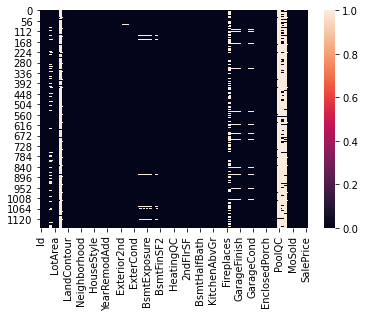

In [7]:
sns.heatmap(df.isnull())

<AxesSubplot:xlabel='LotFrontage', ylabel='Density'>

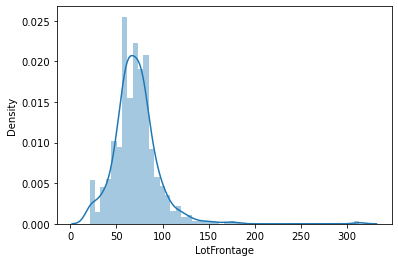

In [8]:
sns.distplot(df['LotFrontage'])

Data is normally distributed in this column

<AxesSubplot:xlabel='MasVnrArea', ylabel='Density'>

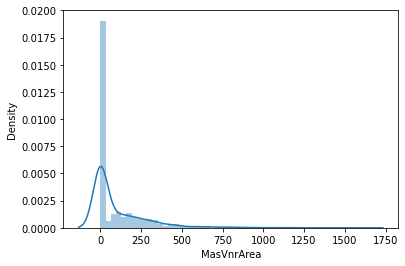

In [9]:
sns.distplot(df['MasVnrArea']) 

Data is not distributed normally in this column

<AxesSubplot:xlabel='GarageYrBlt', ylabel='Density'>

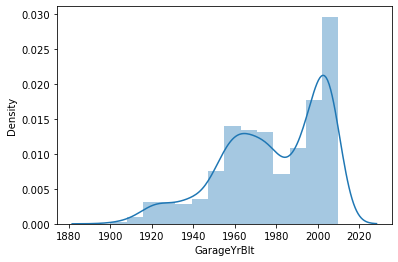

In [10]:
sns.distplot(df['GarageYrBlt']) 

Data is not distributed normally in this column

The columns which are normally distributed, I have applied mean where as the columns which are not distributed normally, I have applied median. I have applied mode where there are categorical variables.

In [11]:
from sklearn.impute import SimpleImputer
si=SimpleImputer(missing_values=np.NaN,strategy='most_frequent')
df['MasVnrType']=si.fit_transform(df['MasVnrType'].values.reshape(-1,1))
df['BsmtQual']=si.fit_transform(df['BsmtQual'].values.reshape(-1,1))
df['BsmtCond']=si.fit_transform(df['BsmtCond'].values.reshape(-1,1))
df['BsmtExposure']=si.fit_transform(df['BsmtExposure'].values.reshape(-1,1))
df['BsmtFinType1']=si.fit_transform(df['BsmtFinType1'].values.reshape(-1,1))
df['BsmtFinType2']=si.fit_transform(df['BsmtFinType2'].values.reshape(-1,1))
df['FireplaceQu']=si.fit_transform(df['FireplaceQu'].values.reshape(-1,1))
df['GarageType']=si.fit_transform(df['GarageType'].values.reshape(-1,1))
df['GarageFinish']=si.fit_transform(df['GarageFinish'].values.reshape(-1,1))
df['GarageQual']=si.fit_transform(df['GarageQual'].values.reshape(-1,1))
df['GarageCond']=si.fit_transform(df['GarageCond'].values.reshape(-1,1))

In [12]:
si=SimpleImputer(missing_values=np.NaN,strategy='median')
df['MasVnrArea']=si.fit_transform(df['MasVnrArea'].values.reshape(-1,1))
df['GarageYrBlt']=si.fit_transform(df['GarageYrBlt'].values.reshape(-1,1))

In [13]:
si=SimpleImputer(missing_values=np.NaN,strategy='mean')
df['LotFrontage']=si.fit_transform(df['LotFrontage'].values.reshape(-1,1))

In [14]:
df.drop(['Alley','PoolQC','Fence','MiscFeature'],axis=1,inplace=True)

I have dropped alley, poolqc, fence and miscfeature columns because around 95% of the data was missing in those columns.

In [15]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,70.98847,4928,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,2,2007,WD,Normal,128000
1,889,20,RL,95.00000,15865,Pave,IR1,Lvl,AllPub,Inside,...,0,0,224,0,0,10,2007,WD,Normal,268000
2,793,60,RL,92.00000,9920,Pave,IR1,Lvl,AllPub,CulDSac,...,0,0,0,0,0,6,2007,WD,Normal,269790
3,110,20,RL,105.00000,11751,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,1,2010,COD,Normal,190000
4,422,20,RL,70.98847,16635,Pave,IR1,Lvl,AllPub,FR2,...,0,0,0,0,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.00000,14054,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,11,2006,New,Partial,219210
6,561,20,RL,70.98847,11341,Pave,IR1,Lvl,AllPub,Inside,...,0,0,95,0,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.00000,13125,Pave,Reg,Lvl,AllPub,Corner,...,0,0,0,0,0,1,2006,WD,Normal,155000
8,503,20,RL,70.00000,9170,Pave,Reg,Lvl,AllPub,Corner,...,184,0,0,0,400,4,2007,WD,Normal,140000
9,576,50,RL,80.00000,8480,Pave,Reg,Lvl,AllPub,Inside,...,102,0,0,0,0,10,2008,COD,Abnorml,118500


In [16]:
df.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual 

Now, here we have no missing values after applying mean, median and mode.

In [17]:
df.shape

(1168, 77)

Now, we have 1168 rows and 77 columns

# Summary Statistics

In [18]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,...,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,70.988470,10484.749144,6.104452,5.595890,1970.930651,1984.758562,101.696918,444.726027,...,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,416.159877,41.940650,22.437056,8957.442311,1.390153,1.124343,30.145255,20.785185,182.218483,462.664785,...,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,360.500000,20.000000,60.000000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,714.500000,50.000000,70.988470,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,...,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,1079.500000,70.000000,79.250000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,...,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,1460.000000,190.000000,313.000000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


There is a large difference in the 75th percentile and max in id, lotarea, masvnrarea columns.

# To check correlation

In [19]:
dfcorr=df.corr()
dfcorr

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.004259,-0.005969,-0.029212,-0.036965,0.039761,-0.016942,-0.018590,-0.061397,0.003868,...,-0.027498,-0.013642,0.004885,-0.021773,0.005169,0.065832,0.001304,0.023479,-0.008853,-0.023897
MSSubClass,0.004259,1.000000,-0.336681,-0.124151,0.070462,-0.056978,0.023988,0.056618,0.028215,-0.052236,...,-0.022609,0.017468,-0.004252,-0.043210,-0.013291,0.009583,-0.023503,-0.016015,-0.038595,-0.060775
LotFrontage,-0.005969,-0.336681,1.000000,0.299452,0.229218,-0.047573,0.112655,0.088799,0.188108,0.228996,...,0.088334,0.151328,0.020902,0.051084,0.030405,0.196001,-0.001329,0.022517,-0.003885,0.323779
LotArea,-0.029212,-0.124151,0.299452,1.000000,0.107188,0.017513,0.005506,0.027228,0.120192,0.221851,...,0.216720,0.093080,-0.007446,0.025794,0.025256,0.097107,0.051679,0.015141,-0.035399,0.249499
OverallQual,-0.036965,0.070462,0.229218,0.107188,1.000000,-0.083167,0.575800,0.555945,0.403985,0.219643,...,0.227137,0.341030,-0.098374,0.045919,0.059387,0.072247,-0.025786,0.090638,-0.048759,0.789185
OverallCond,0.039761,-0.056978,-0.047573,0.017513,-0.083167,1.000000,-0.377731,0.080669,-0.135133,-0.028810,...,0.012290,-0.024899,0.056074,0.040476,0.069463,-0.003603,0.075178,0.005519,0.055517,-0.065642
YearBuilt,-0.016942,0.023988,0.112655,0.005506,0.575800,-0.377731,1.000000,0.592829,0.318562,0.227933,...,0.204830,0.191069,-0.373544,0.037079,-0.058760,0.006408,-0.030008,0.031754,-0.013976,0.514408
YearRemodAdd,-0.018590,0.056618,0.088799,0.027228,0.555945,0.080669,0.592829,1.000000,0.178583,0.114430,...,0.197410,0.238755,-0.193574,0.064763,-0.046220,0.006874,-0.001199,0.024663,0.033265,0.507831
MasVnrArea,-0.061397,0.028215,0.188108,0.120192,0.403985,-0.135133,0.318562,0.178583,1.000000,0.263377,...,0.152083,0.127876,-0.102142,0.019123,0.047375,0.013836,-0.027263,0.012707,-0.013220,0.460535
BsmtFinSF1,0.003868,-0.052236,0.228996,0.221851,0.219643,-0.028810,0.227933,0.114430,0.263377,1.000000,...,0.192939,0.108802,-0.082351,0.025485,0.033490,0.154769,0.008314,0.007482,0.005614,0.362874


<AxesSubplot:>

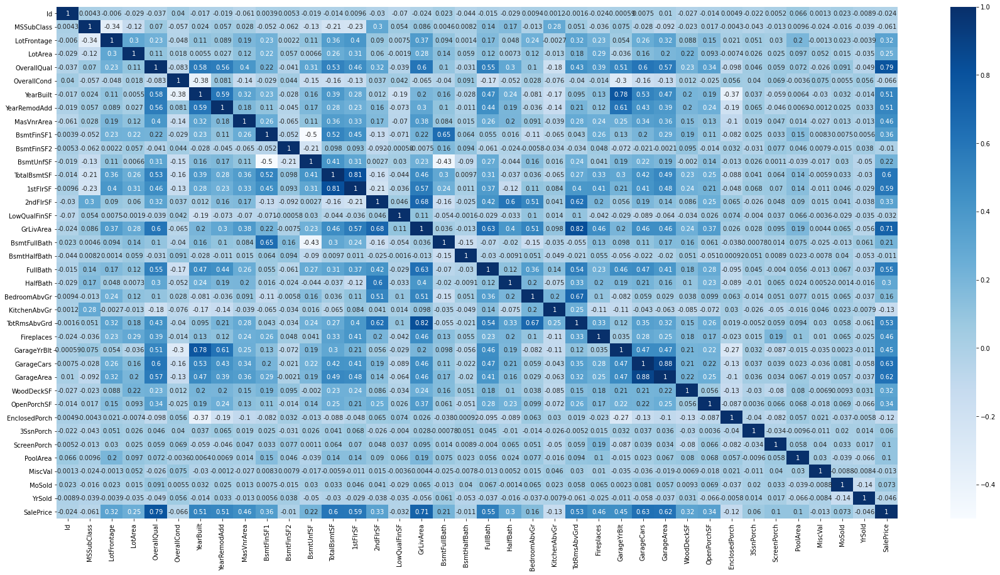

In [20]:
plt.figure(figsize=(30,15))
sns.heatmap(dfcorr,cmap='Blues',annot=True)

# EDA

<AxesSubplot:xlabel='MSZoning', ylabel='count'>

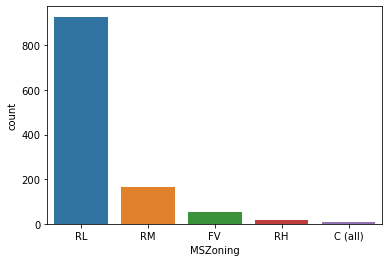

In [30]:
sns.countplot(df['MSZoning'])

In [23]:
df['LandContour'].value_counts()

Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64

The general zoning classification of the sale for Residential Low Density(RL) is 928, Residential High Density(RH) is 16, Residential Medium Density(RM) is 163, Floating Village Residential(FV) is 52 and Commercial is 9.

<AxesSubplot:xlabel='Street', ylabel='count'>

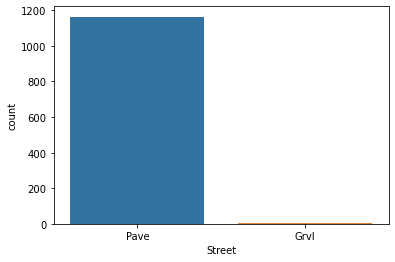

In [31]:
sns.countplot(df['Street'])

In Street, The type of road access to property for Pave is 1164 and Gravel is 4.

<AxesSubplot:xlabel='LotShape', ylabel='count'>

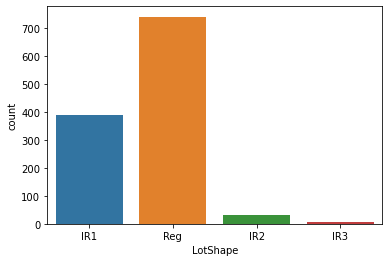

In [32]:
sns.countplot(df['LotShape'])

The shape of the property for regular is 740, slightly irregular is 390, moderately irregular is 32, and irregular is 6.

<AxesSubplot:xlabel='LandContour', ylabel='count'>

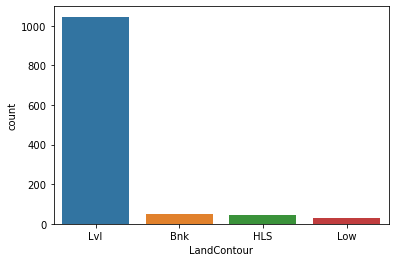

In [33]:
sns.countplot(df['LandContour'])

<AxesSubplot:xlabel='Utilities', ylabel='count'>

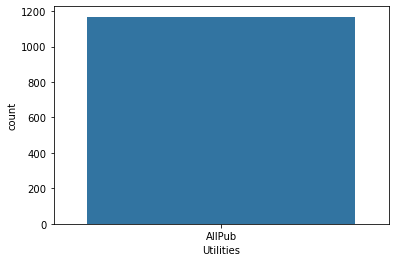

In [34]:
sns.countplot(df['Utilities'])

<AxesSubplot:xlabel='LotConfig', ylabel='count'>

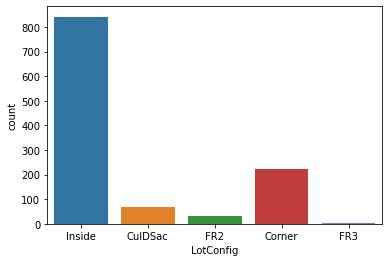

In [35]:
sns.countplot(df['LotConfig'])

<AxesSubplot:xlabel='LandSlope', ylabel='count'>

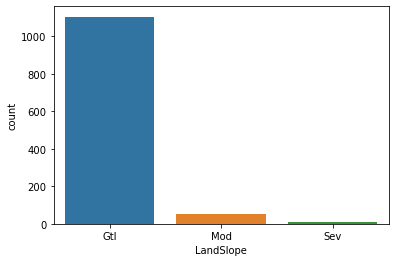

In [36]:
sns.countplot(df['LandSlope'])

<AxesSubplot:xlabel='BldgType', ylabel='count'>

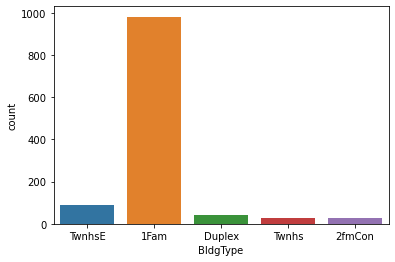

In [39]:
sns.countplot(df['BldgType'])

<AxesSubplot:xlabel='HouseStyle', ylabel='count'>

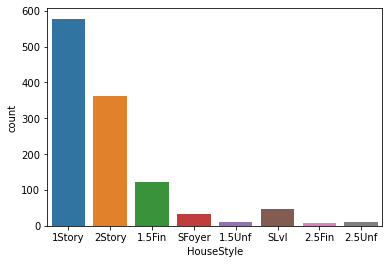

In [40]:
sns.countplot(df['HouseStyle'])

<AxesSubplot:xlabel='OverallQual', ylabel='count'>

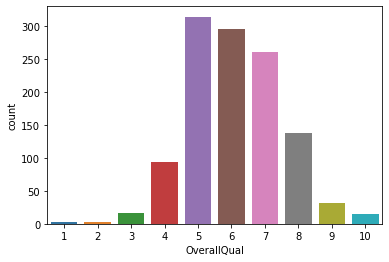

In [41]:
sns.countplot(df['OverallQual'])

<AxesSubplot:xlabel='OverallCond', ylabel='count'>

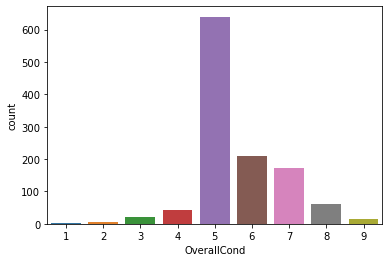

In [42]:
sns.countplot(df['OverallCond'])

<AxesSubplot:xlabel='RoofStyle', ylabel='count'>

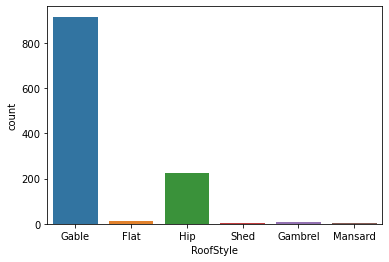

In [43]:
sns.countplot(df['RoofStyle'])

<AxesSubplot:xlabel='RoofMatl', ylabel='count'>

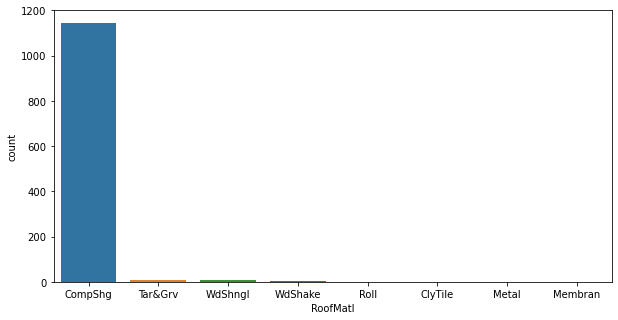

In [45]:
plt.figure(figsize=(10,5))
sns.countplot(df['RoofMatl'])

<AxesSubplot:xlabel='Foundation', ylabel='count'>

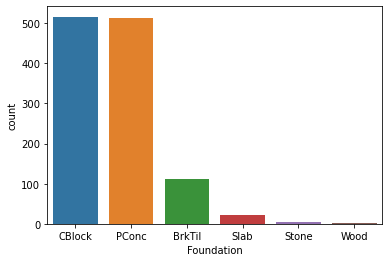

In [46]:
sns.countplot(df['Foundation'])

<AxesSubplot:xlabel='BsmtQual', ylabel='count'>

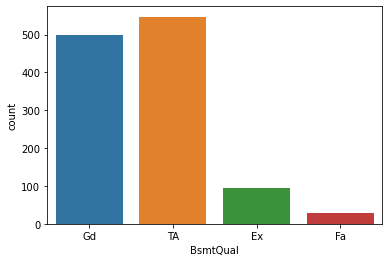

In [47]:
sns.countplot(df['BsmtQual'])

<AxesSubplot:xlabel='BsmtExposure', ylabel='count'>

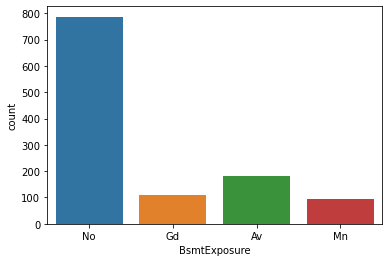

In [48]:
sns.countplot(df['BsmtExposure'])

<AxesSubplot:xlabel='BsmtFinType1', ylabel='count'>

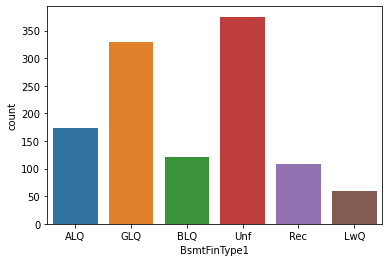

In [49]:
sns.countplot(df['BsmtFinType1'])

<AxesSubplot:xlabel='Electrical', ylabel='count'>

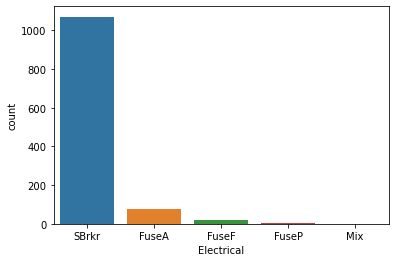

In [51]:
sns.countplot(df['Electrical'])

<AxesSubplot:xlabel='SaleCondition', ylabel='count'>

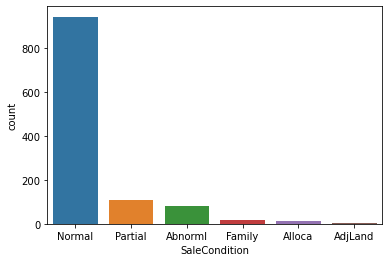

In [52]:
sns.countplot(df['SaleCondition'])

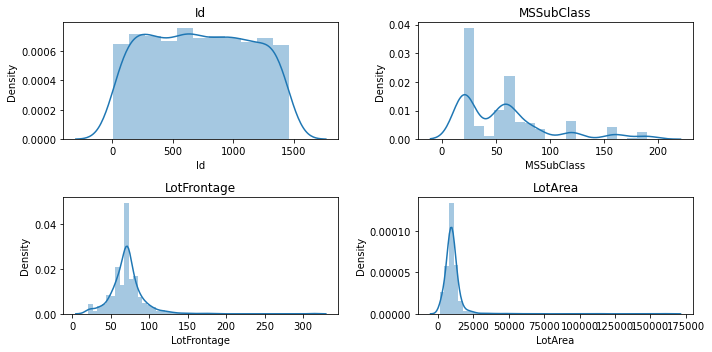

In [24]:
k=['Id','MSSubClass','LotFrontage','LotArea']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.distplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

The data is distributed normally in id column where as in the rest of the columns, the datas are not distributed normally. 

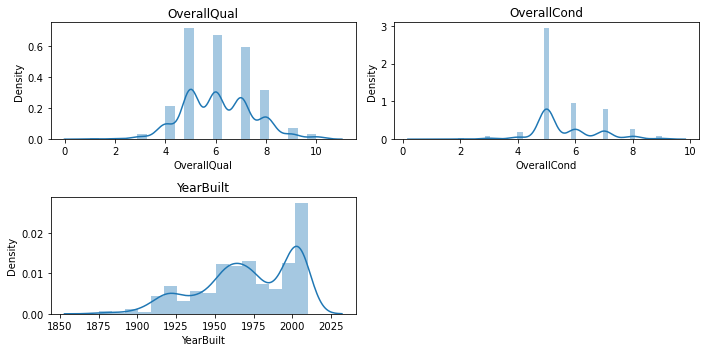

In [71]:
k=['OverallQual','OverallCond','YearBuilt']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.distplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

The datas are not distributed normally in any of the columns.

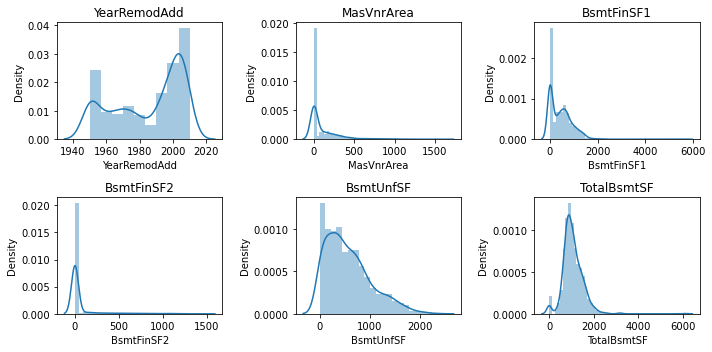

In [54]:
k=['YearRemodAdd','MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.distplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

The datas are not distributed normally in any of the columns.

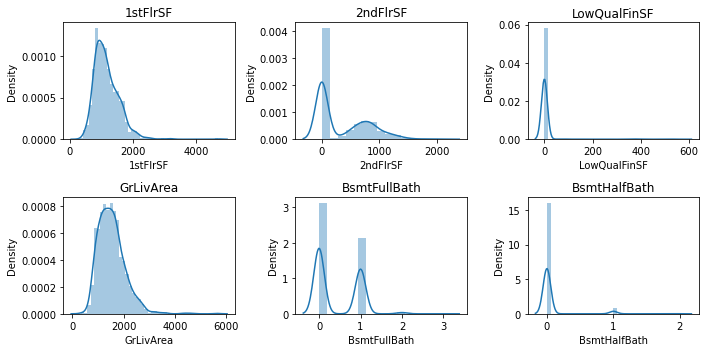

In [55]:
k=['1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea','BsmtFullBath','BsmtHalfBath']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.distplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

The datas are distributed normally in 1stFlrSF and GrLivArea columns.The datas are not distributed normally in the rest of the four columns.

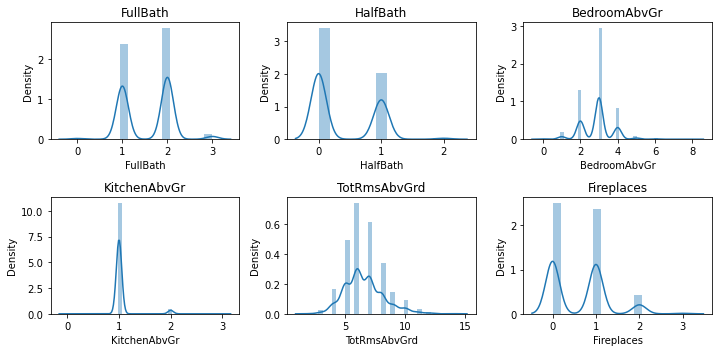

In [56]:
k=['FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.distplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

The datas are not distributed normally in any of the columns.

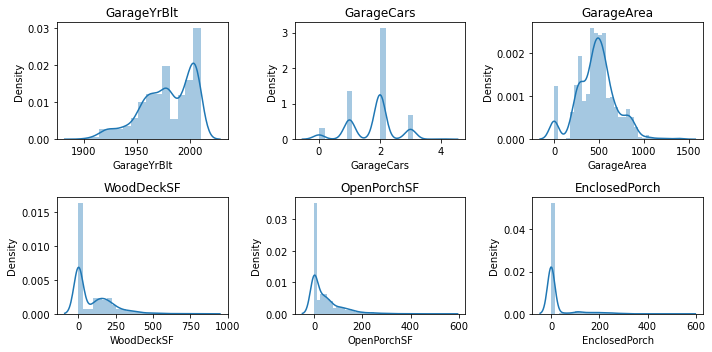

In [57]:
k=['GarageYrBlt','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.distplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

The datas are not distributed normally in any of the columns.

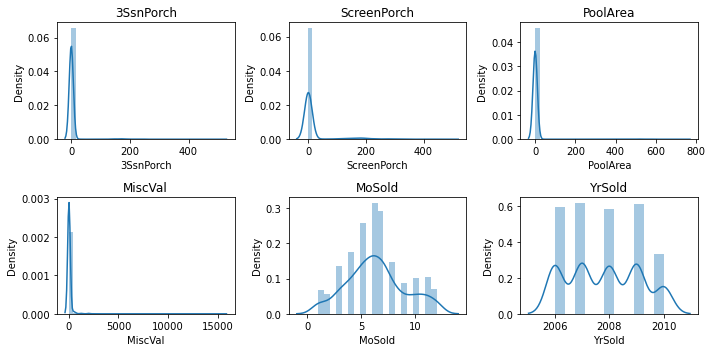

In [58]:
k=['3SsnPorch','ScreenPorch','PoolArea','MiscVal','MoSold','YrSold']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.distplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

The datas are not distributed normally in any of the columns.

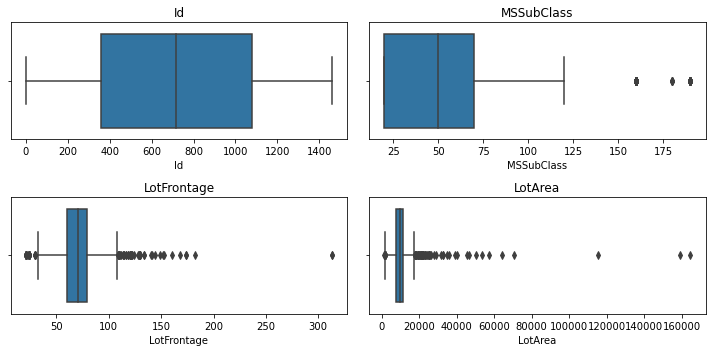

In [72]:
k=['Id','MSSubClass','LotFrontage','LotArea']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.boxplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

There are outliers present in these columns except in Id column where there are no outliers

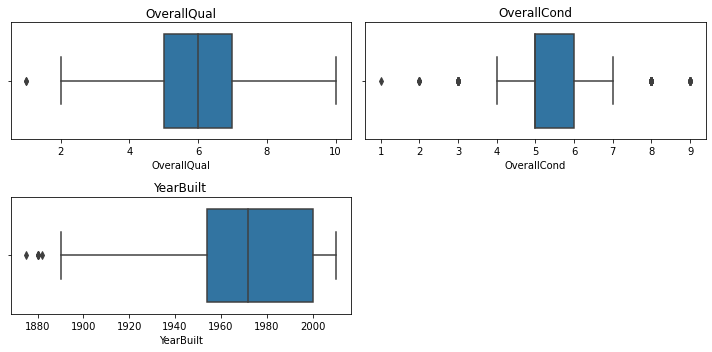

In [73]:
k=['OverallQual','OverallCond','YearBuilt']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.boxplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

There are outliers present in these columns.

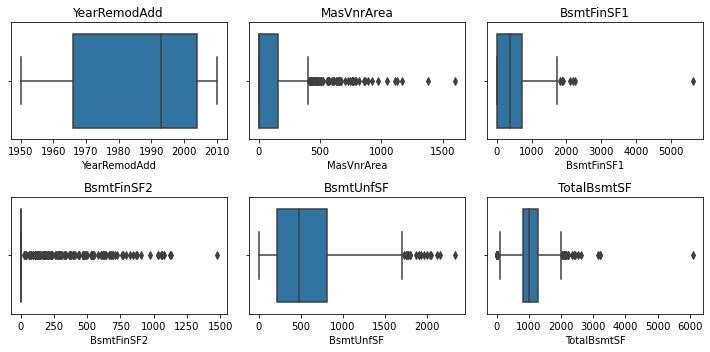

In [60]:
k=['YearRemodAdd','MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.boxplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

There are some outliers present in these columns except in YearRemoddd column where there are no outliers.

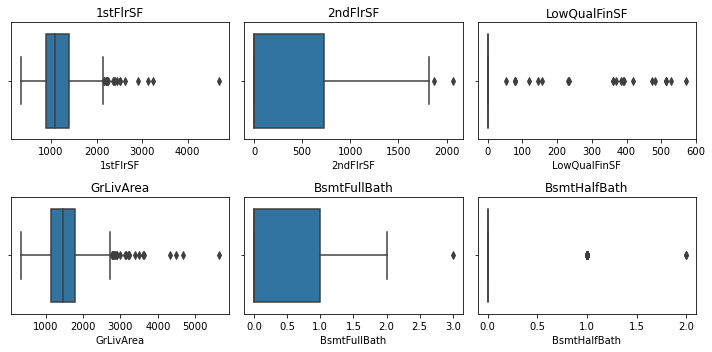

In [61]:
k=['1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea','BsmtFullBath','BsmtHalfBath']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.boxplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

There are outliers present in these columns.

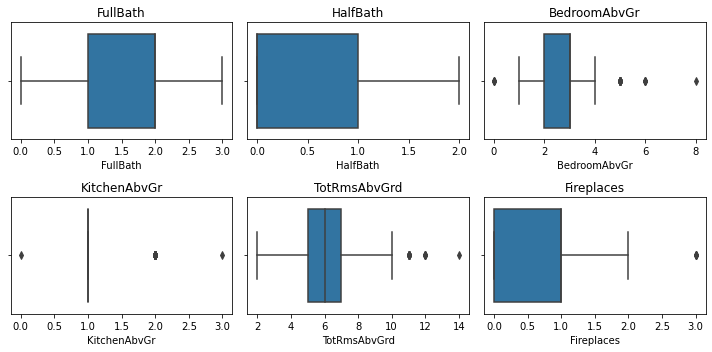

In [62]:
k=['FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.boxplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

There are outliers present in these columns except in FullBath column where there are no outliers

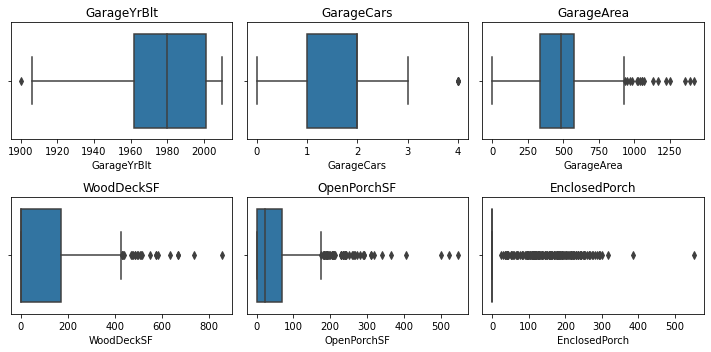

In [63]:
k=['GarageYrBlt','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.boxplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

There are outliers present in these columns.

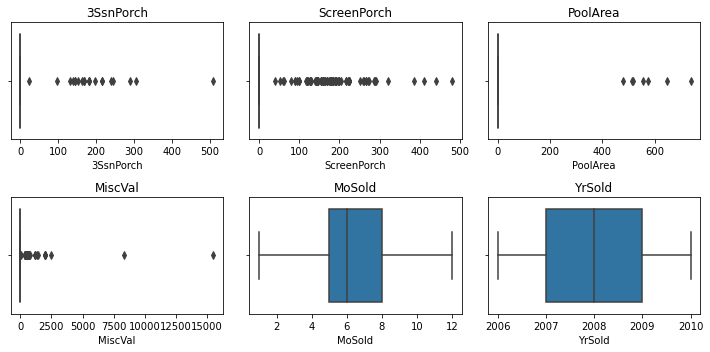

In [25]:
k=['3SsnPorch','ScreenPorch','PoolArea','MiscVal','MoSold','YrSold']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.boxplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

There are outliers present in these columns escept in MoSold and YrSold columns where there are no outliers

In [21]:
y=df[['SalePrice']]

In [22]:
df.drop('SalePrice',axis=1,inplace=True)

In [23]:
df.skew()

Id                0.026526
MSSubClass        1.422019
LotFrontage       2.710383
LotArea          10.659285
OverallQual       0.175082
OverallCond       0.580714
YearBuilt        -0.579204
YearRemodAdd     -0.495864
MasVnrArea        2.835718
BsmtFinSF1        1.871606
BsmtFinSF2        4.365829
BsmtUnfSF         0.909057
TotalBsmtSF       1.744591
1stFlrSF          1.513707
2ndFlrSF          0.823479
LowQualFinSF      8.666142
GrLivArea         1.449952
BsmtFullBath      0.627106
BsmtHalfBath      4.264403
FullBath          0.057809
HalfBath          0.656492
BedroomAbvGr      0.243855
KitchenAbvGr      4.365259
TotRmsAbvGrd      0.644657
Fireplaces        0.671966
GarageYrBlt      -0.674913
GarageCars       -0.358556
GarageArea        0.189665
WoodDeckSF        1.504929
OpenPorchSF       2.410840
EnclosedPorch     3.043610
3SsnPorch         9.770611
ScreenPorch       4.105741
PoolArea         13.243711
MiscVal          23.065943
MoSold            0.220979
YrSold            0.115765
d

There is some skewness present in some of the columns. Lets remove it by applying some transforms.

In [24]:
df_new=df.copy(deep=True)

<AxesSubplot:xlabel='MSSubClass', ylabel='Density'>

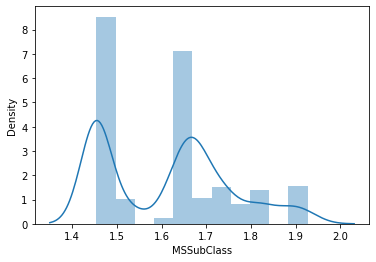

In [27]:
df_new['MSSubClass']=np.sqrt(df_new['MSSubClass'])
sns.distplot(df_new['MSSubClass'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='LotFrontage', ylabel='Density'>

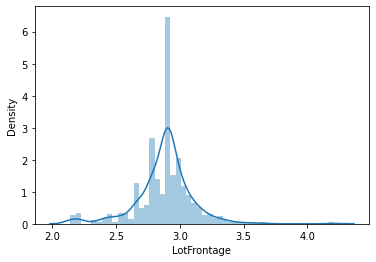

In [29]:
df_new['LotFrontage']=np.sqrt(df_new['LotFrontage'])
sns.distplot(df_new['LotFrontage'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='LotArea', ylabel='Density'>

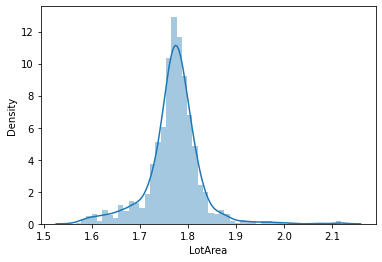

In [33]:
df_new['LotArea']=np.sqrt(df_new['LotArea'])
sns.distplot(df_new['LotArea'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='OverallCond', ylabel='Density'>

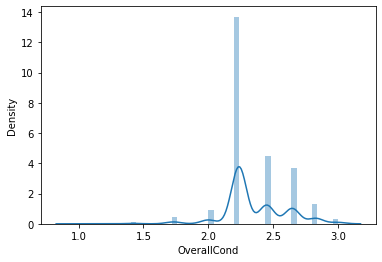

In [34]:
df_new['OverallCond']=np.sqrt(df_new['OverallCond'])
sns.distplot(df_new['OverallCond'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='MasVnrArea', ylabel='Density'>

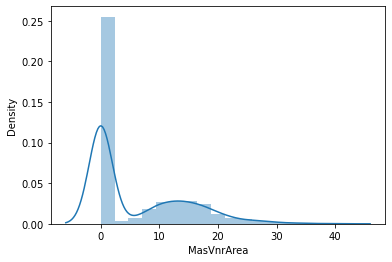

In [35]:
df_new['MasVnrArea']=np.sqrt(df_new['MasVnrArea'])
sns.distplot(df_new['MasVnrArea'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='BsmtFinSF1', ylabel='Density'>

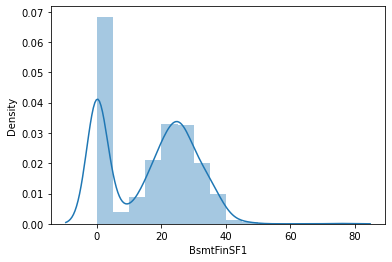

In [37]:
df_new['BsmtFinSF1']=np.sqrt(df_new['BsmtFinSF1'])
sns.distplot(df_new['BsmtFinSF1'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='BsmtFinSF2', ylabel='Density'>

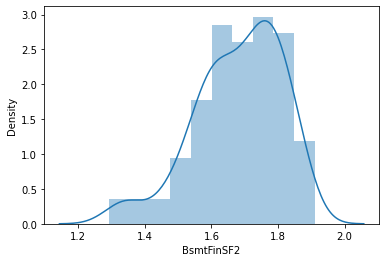

In [41]:
df_new['BsmtFinSF2']=np.sqrt(df_new['BsmtFinSF2'])
sns.distplot(df_new['BsmtFinSF2'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='BsmtUnfSF', ylabel='Density'>

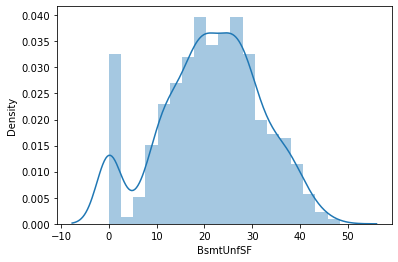

In [43]:
df_new['BsmtUnfSF']=np.sqrt(df_new['BsmtUnfSF'])
sns.distplot(df_new['BsmtUnfSF'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='TotalBsmtSF', ylabel='Density'>

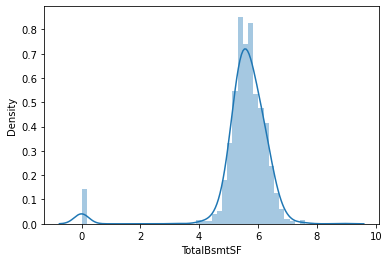

In [48]:
df_new['TotalBsmtSF']=np.sqrt(df_new['TotalBsmtSF'])
sns.distplot(df_new['TotalBsmtSF'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='1stFlrSF', ylabel='Density'>

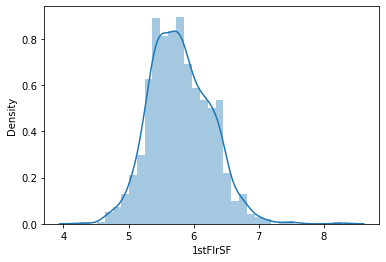

In [49]:
df_new['1stFlrSF']=np.sqrt(df_new['1stFlrSF'])
sns.distplot(df_new['1stFlrSF'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='2ndFlrSF', ylabel='Density'>

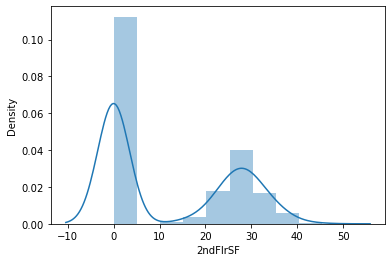

In [46]:
df_new['2ndFlrSF']=np.sqrt(df_new['2ndFlrSF'])
sns.distplot(df_new['2ndFlrSF'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='LowQualFinSF', ylabel='Density'>

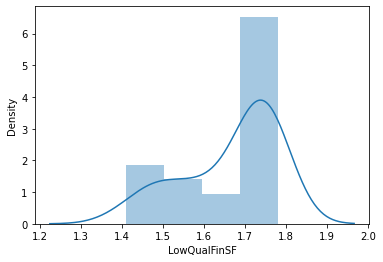

In [53]:
df_new['LowQualFinSF']=np.sqrt(df_new['LowQualFinSF'])
sns.distplot(df_new['LowQualFinSF'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='GrLivArea', ylabel='Density'>

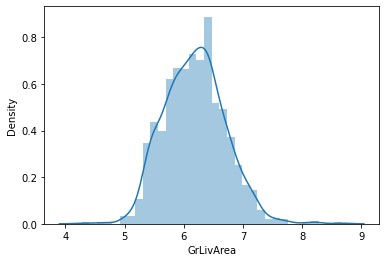

In [56]:
df_new['GrLivArea']=np.sqrt(df_new['GrLivArea'])
sns.distplot(df_new['GrLivArea'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='BsmtFullBath', ylabel='Density'>

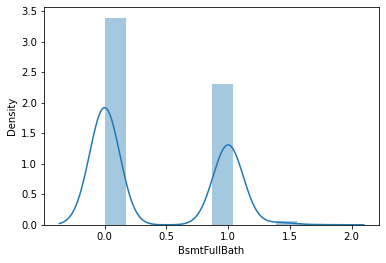

In [58]:
df_new['BsmtFullBath']=np.sqrt(df_new['BsmtFullBath'])
sns.distplot(df_new['BsmtFullBath'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='BsmtHalfBath', ylabel='Density'>

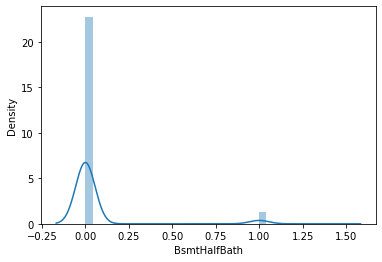

In [39]:
df_new['BsmtHalfBath']=np.sqrt(df_new['BsmtHalfBath'])
sns.distplot(df_new['BsmtHalfBath'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='HalfBath', ylabel='Density'>

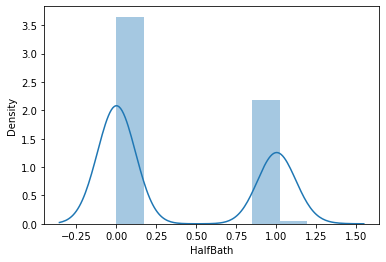

In [62]:
df_new['HalfBath']=np.sqrt(df_new['HalfBath'])
sns.distplot(df_new['HalfBath'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='KitchenAbvGr', ylabel='Density'>

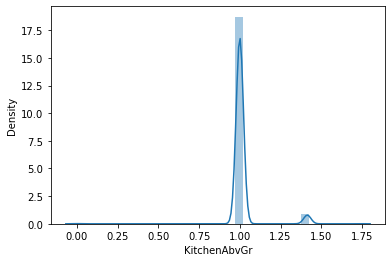

In [41]:
df_new['KitchenAbvGr']=np.sqrt(df_new['KitchenAbvGr'])
sns.distplot(df_new['KitchenAbvGr'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='TotRmsAbvGrd', ylabel='Density'>

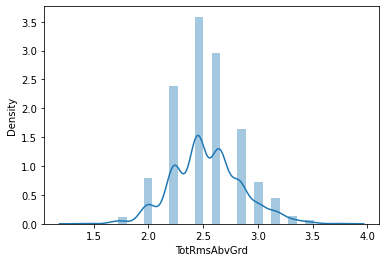

In [63]:
df_new['TotRmsAbvGrd']=np.sqrt(df_new['TotRmsAbvGrd'])
sns.distplot(df_new['TotRmsAbvGrd'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='Fireplaces', ylabel='Density'>

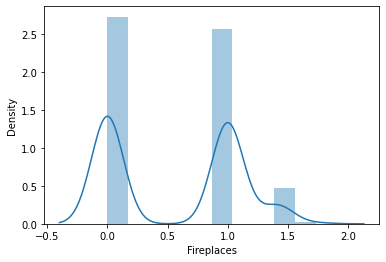

In [65]:
df_new['Fireplaces']=np.sqrt(df_new['Fireplaces'])
sns.distplot(df_new['Fireplaces'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='WoodDeckSF', ylabel='Density'>

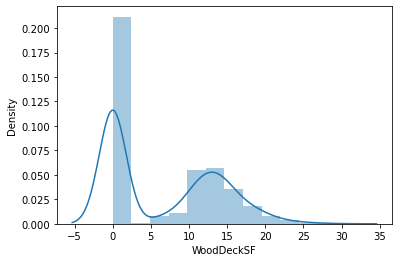

In [66]:
df_new['WoodDeckSF']=np.sqrt(df_new['WoodDeckSF'])
sns.distplot(df_new['WoodDeckSF'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='OpenPorchSF', ylabel='Density'>

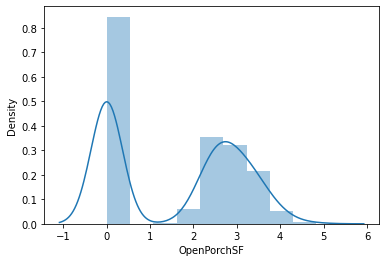

In [70]:
df_new['OpenPorchSF']=np.sqrt(df_new['OpenPorchSF'])
sns.distplot(df_new['OpenPorchSF'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='EnclosedPorch', ylabel='Density'>

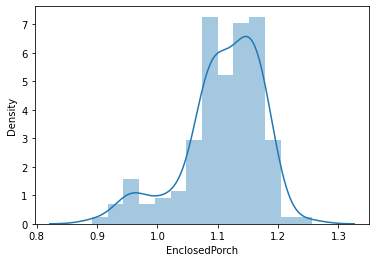

In [89]:
df_new['EnclosedPorch']=np.sqrt(df_new['EnclosedPorch'])
sns.distplot(df_new['EnclosedPorch'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='3SsnPorch', ylabel='Density'>

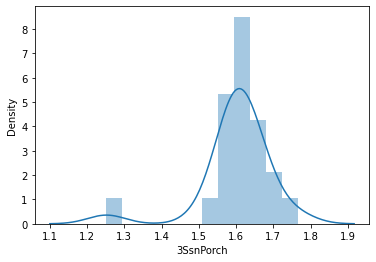

In [78]:
df_new['3SsnPorch']=np.sqrt(df_new['3SsnPorch'])
sns.distplot(df_new['3SsnPorch'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='ScreenPorch', ylabel='Density'>

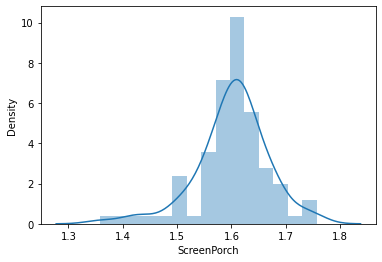

In [81]:
df_new['ScreenPorch']=np.sqrt(df_new['ScreenPorch'])
sns.distplot(df_new['ScreenPorch'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='PoolArea', ylabel='Density'>

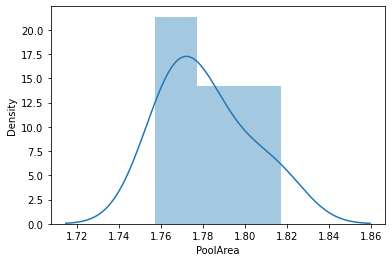

In [84]:
df_new['PoolArea']=np.sqrt(df_new['PoolArea'])
sns.distplot(df_new['PoolArea'])

I removed the skewness in this column by applying sqrt transform.

<AxesSubplot:xlabel='MiscVal', ylabel='Density'>

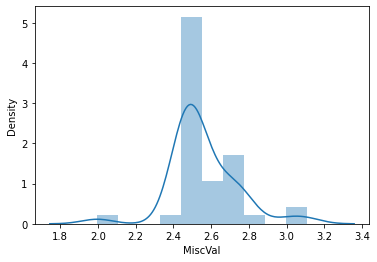

In [86]:
df_new['MiscVal']=np.sqrt(df_new['MiscVal'])
sns.distplot(df_new['MiscVal'])

I removed the skewness in this column by applying sqrt transform.

In [90]:
df_new.skew()

Id               0.026526
MSSubClass       0.335502
LotFrontage     -0.215047
LotArea          0.153872
OverallQual      0.175082
OverallCond      0.045434
YearBuilt       -0.579204
YearRemodAdd    -0.495864
MasVnrArea       1.091919
BsmtFinSF1      -0.011789
BsmtFinSF2      -0.724282
BsmtUnfSF       -0.233752
TotalBsmtSF     -3.883699
1stFlrSF         0.380410
2ndFlrSF         0.425547
LowQualFinSF    -0.959275
GrLivArea        0.301870
BsmtFullBath     0.391353
BsmtHalfBath     4.264403
FullBath         0.057809
HalfBath         0.498848
BedroomAbvGr     0.243855
KitchenAbvGr     4.365259
TotRmsAbvGrd     0.232956
Fireplaces       0.047671
GarageYrBlt     -0.674913
GarageCars      -0.358556
GarageArea       0.189665
WoodDeckSF       0.458303
OpenPorchSF      0.033320
EnclosedPorch   -1.013079
3SsnPorch       -2.340665
ScreenPorch     -0.784773
PoolArea         0.846680
MiscVal          0.489660
MoSold           0.220979
YrSold           0.115765
dtype: float64

Here, we can say that the skewness has been removed in all the columns except in some of the columns, where there is some skewness present in some of the columns.

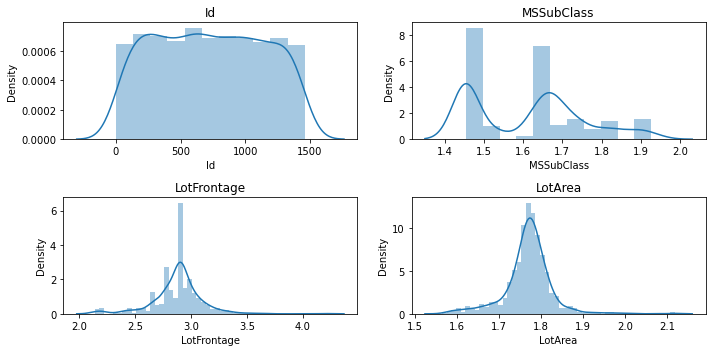

In [91]:
k=['Id','MSSubClass','LotFrontage','LotArea']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.distplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

The data is distributed normally in id and LotArea columns where as in the rest of the two columns, the datas are not distributed normally.

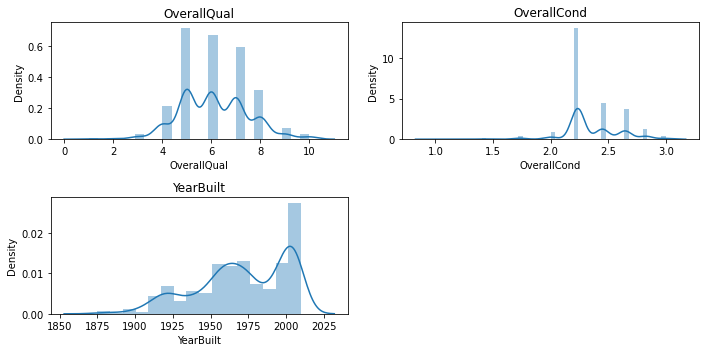

In [92]:
k=['OverallQual','OverallCond','YearBuilt']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.distplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

The datas are not normally distributed in these columns.

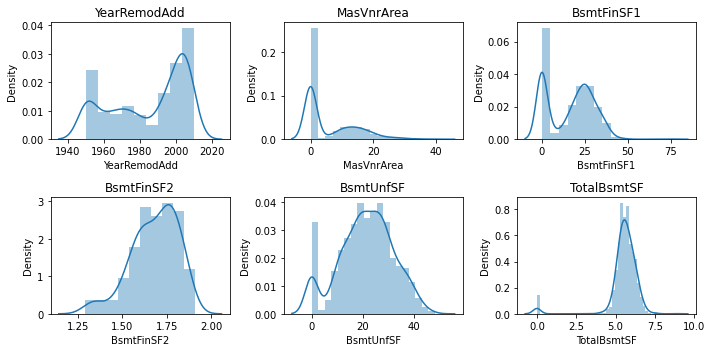

In [93]:
k=['YearRemodAdd','MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.distplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

The datas are not normally distributed in these columns apart from BsmtFinSF2 column where the data is distributed normally.

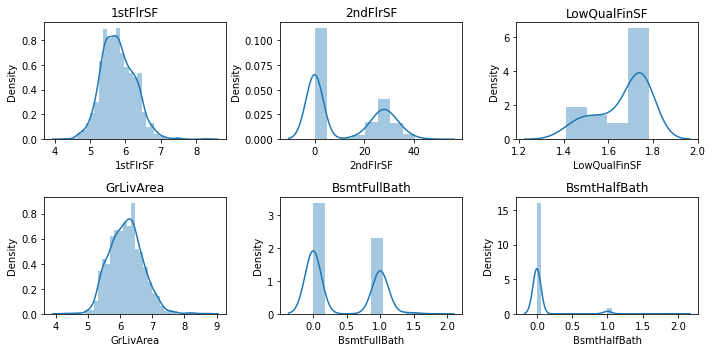

In [94]:
k=['1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea','BsmtFullBath','BsmtHalfBath']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.distplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

The datas are distributed normally in 1stFlrDF and GrLivArea columns where as the datas are not normally distributed in the other columns.

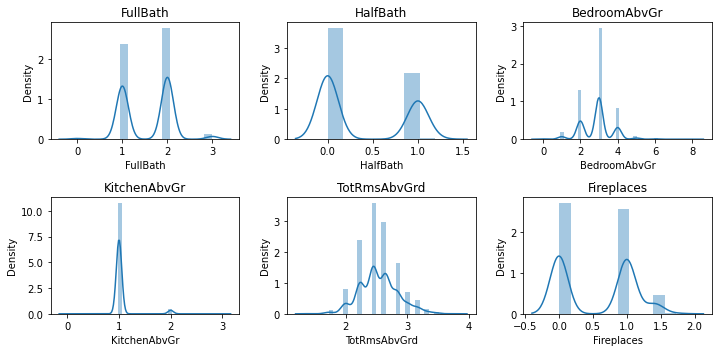

In [95]:
k=['FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.distplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

The datas are not normally distributed in these columns.

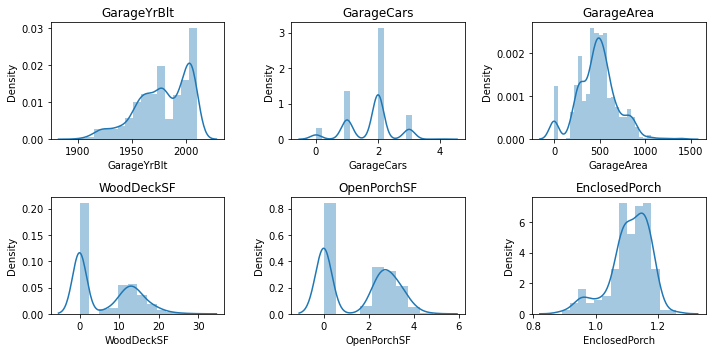

In [96]:
k=['GarageYrBlt','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.distplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

The datas are not normally distributed in these columns.

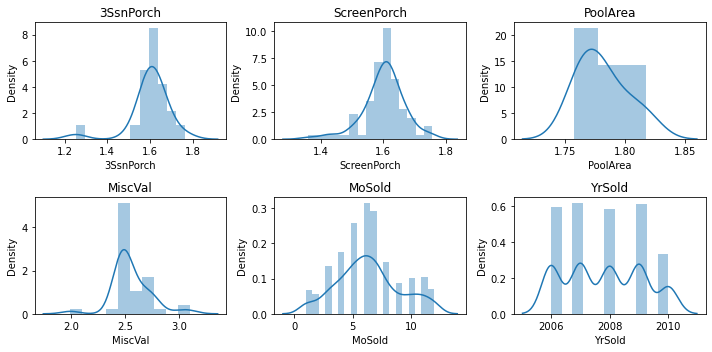

In [97]:
k=['3SsnPorch','ScreenPorch','PoolArea','MiscVal','MoSold','YrSold']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.distplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

The datas are distributed normally in ScreenPorch and PoolArea columns where as in the other columns, the datas are not normally distributed.

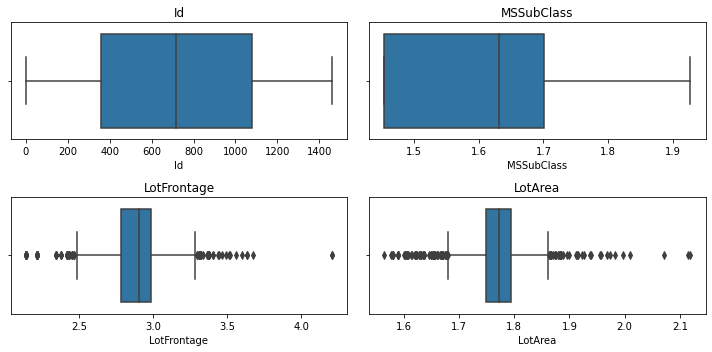

In [98]:
k=['Id','MSSubClass','LotFrontage','LotArea']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.boxplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

There are outliers present in these columns except in Id and MSSubClass columns where there are no outliers

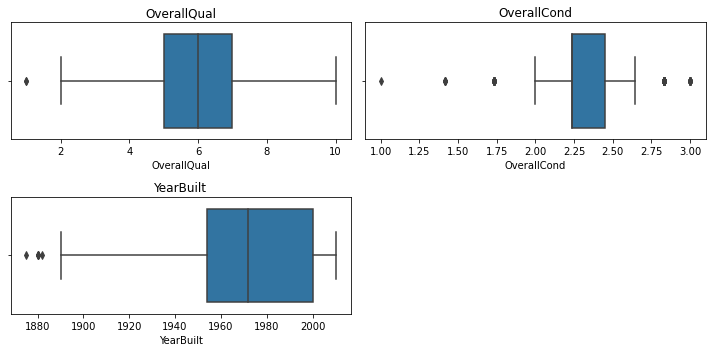

In [99]:
k=['OverallQual','OverallCond','YearBuilt']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.boxplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

There are some outliers present in these columns.

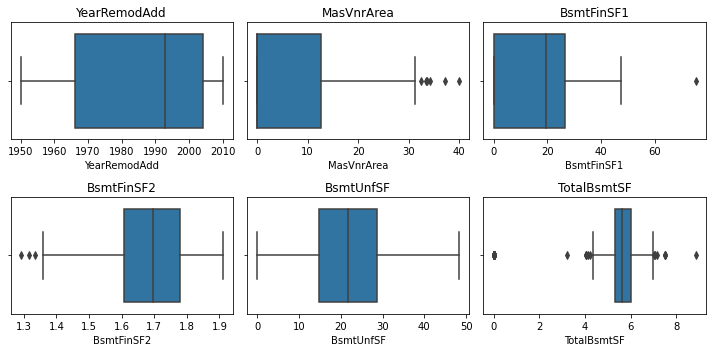

In [100]:
k=['YearRemodAdd','MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.boxplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

There are some outliers present in these columns except in YearRemoddd and BsmtUnfSF columns where there are no outliers.

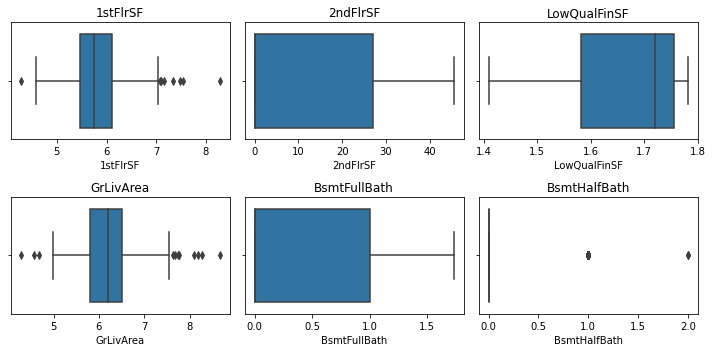

In [101]:
k=['1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea','BsmtFullBath','BsmtHalfBath']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.boxplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

There are some outliers present in these columns except in 2ndFlrSF, LowQualFinSF and BsmtFullBath columns where there are no outliers.

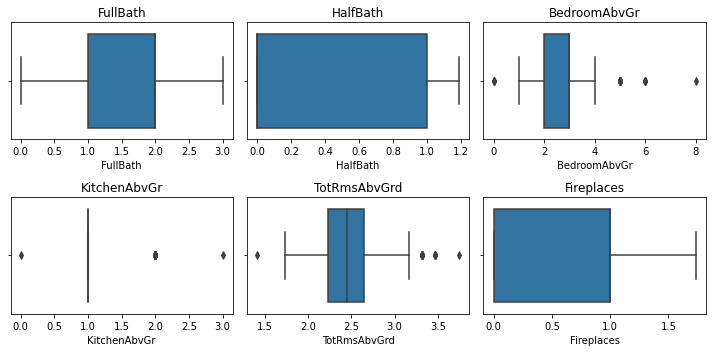

In [102]:
k=['FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.boxplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

There are some outliers present in these columns except in FullBath, HalfBath and Fireplaces columns where there are no outliers.

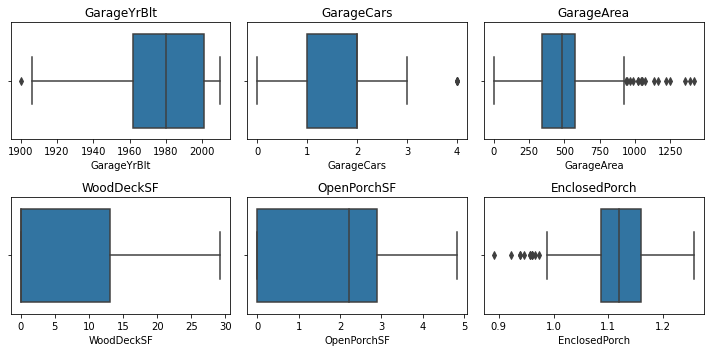

In [103]:
k=['GarageYrBlt','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.boxplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

There are some outliers present in these columns except in WoodDeckSF and OpenPorchSF columns where there are no outliers.

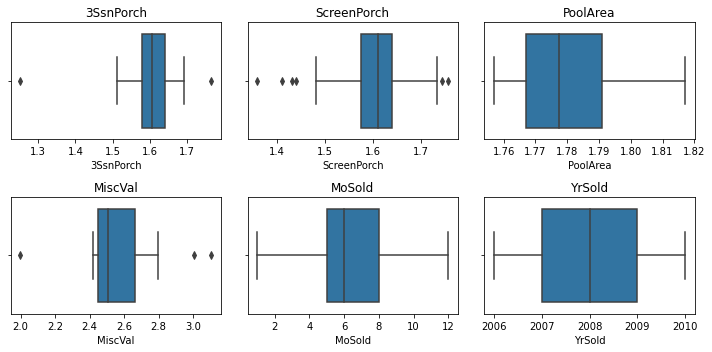

In [104]:
k=['3SsnPorch','ScreenPorch','PoolArea','MiscVal','MoSold','YrSold']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,3,j)
    sns.boxplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()

There are some outliers present in these columns except in PoolArea, MoSold and YrSold columns where there are no outliers.

In [25]:
df_new

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,127,120,RL,70.98847,4928,Pave,IR1,Lvl,AllPub,Inside,...,205,0,0,0,0,0,2,2007,WD,Normal
1,889,20,RL,95.00000,15865,Pave,IR1,Lvl,AllPub,Inside,...,207,0,0,224,0,0,10,2007,WD,Normal
2,793,60,RL,92.00000,9920,Pave,IR1,Lvl,AllPub,CulDSac,...,130,0,0,0,0,0,6,2007,WD,Normal
3,110,20,RL,105.00000,11751,Pave,IR1,Lvl,AllPub,Inside,...,122,0,0,0,0,0,1,2010,COD,Normal
4,422,20,RL,70.98847,16635,Pave,IR1,Lvl,AllPub,FR2,...,0,0,0,0,0,0,6,2009,WD,Normal
5,1197,60,RL,58.00000,14054,Pave,IR1,Lvl,AllPub,Inside,...,17,0,0,0,0,0,11,2006,New,Partial
6,561,20,RL,70.98847,11341,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,95,0,0,5,2010,WD,Normal
7,1041,20,RL,88.00000,13125,Pave,Reg,Lvl,AllPub,Corner,...,0,0,0,0,0,0,1,2006,WD,Normal
8,503,20,RL,70.00000,9170,Pave,Reg,Lvl,AllPub,Corner,...,0,184,0,0,0,400,4,2007,WD,Normal
9,576,50,RL,80.00000,8480,Pave,Reg,Lvl,AllPub,Inside,...,0,102,0,0,0,0,10,2008,COD,Abnorml


In [26]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df_new['MSZoning']=le.fit_transform(df_new['MSZoning'])
df_new['Street']=le.fit_transform(df_new['Street'])
df_new['LotShape']=le.fit_transform(df_new['LotShape'])
df_new['LandContour']=le.fit_transform(df_new['MSZoning'])
df_new['Utilities']=le.fit_transform(df_new['Utilities'])
df_new['LotConfig']=le.fit_transform(df_new['LotConfig'])
df_new['LandSlope']=le.fit_transform(df_new['LandSlope'])
df_new['Neighborhood']=le.fit_transform(df_new['Neighborhood'])
df_new['Condition1']=le.fit_transform(df_new['Condition1'])
df_new['Condition2']=le.fit_transform(df_new['Condition2'])
df_new['BldgType']=le.fit_transform(df_new['BldgType'])
df_new['HouseStyle']=le.fit_transform(df_new['HouseStyle'])
df_new['RoofStyle']=le.fit_transform(df_new['RoofStyle'])
df_new['RoofMatl']=le.fit_transform(df_new['RoofMatl'])
df_new['Exterior1st']=le.fit_transform(df_new['Exterior1st'])
df_new['Exterior2nd']=le.fit_transform(df_new['Exterior2nd'])
df_new['MasVnrType']=le.fit_transform(df_new['MasVnrType'])
df_new['ExterQual']=le.fit_transform(df_new['ExterQual'])
df_new['ExterCond']=le.fit_transform(df_new['ExterCond'])
df_new['BsmtQual']=le.fit_transform(df_new['BsmtQual'])
df_new['Foundation']=le.fit_transform(df_new['Foundation'])
df_new['BsmtCond']=le.fit_transform(df_new['BsmtCond'])
df_new['BsmtExposure']=le.fit_transform(df_new['BsmtExposure'])
df_new['BsmtFinType1']=le.fit_transform(df_new['BsmtFinType1'])
df_new['Exterior1st']=le.fit_transform(df_new['Exterior1st'])
df_new['BsmtFinType2']=le.fit_transform(df_new['BsmtFinType2'])
df_new['Heating']=le.fit_transform(df_new['Heating'])
df_new['HeatingQC']=le.fit_transform(df_new['HeatingQC'])
df_new['CentralAir']=le.fit_transform(df_new['CentralAir'])
df_new['Electrical']=le.fit_transform(df_new['Electrical'])
df_new['KitchenQual']=le.fit_transform(df_new['KitchenQual'])
df_new['Functional']=le.fit_transform(df_new['Functional'])
df_new['FireplaceQu']=le.fit_transform(df_new['FireplaceQu'])
df_new['GarageType']=le.fit_transform(df_new['GarageType'])
df_new['GarageFinish']=le.fit_transform(df_new['GarageFinish'])
df_new['GarageQual']=le.fit_transform(df_new['GarageQual'])
df_new['GarageCond']=le.fit_transform(df_new['GarageCond'])
df_new['PavedDrive']=le.fit_transform(df_new['PavedDrive'])
df_new['SaleType']=le.fit_transform(df_new['SaleType'])
df_new['SaleCondition']=le.fit_transform(df_new['SaleCondition'])

In [27]:
df_new

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,127,120,3,70.98847,4928,1,0,3,0,4,...,205,0,0,0,0,0,2,2007,8,4
1,889,20,3,95.00000,15865,1,0,3,0,4,...,207,0,0,224,0,0,10,2007,8,4
2,793,60,3,92.00000,9920,1,0,3,0,1,...,130,0,0,0,0,0,6,2007,8,4
3,110,20,3,105.00000,11751,1,0,3,0,4,...,122,0,0,0,0,0,1,2010,0,4
4,422,20,3,70.98847,16635,1,0,3,0,2,...,0,0,0,0,0,0,6,2009,8,4
5,1197,60,3,58.00000,14054,1,0,3,0,4,...,17,0,0,0,0,0,11,2006,6,5
6,561,20,3,70.98847,11341,1,0,3,0,4,...,0,0,0,95,0,0,5,2010,8,4
7,1041,20,3,88.00000,13125,1,3,3,0,0,...,0,0,0,0,0,0,1,2006,8,4
8,503,20,3,70.00000,9170,1,3,3,0,0,...,0,184,0,0,0,400,4,2007,8,4
9,576,50,3,80.00000,8480,1,3,3,0,4,...,0,102,0,0,0,0,10,2008,0,0


In [28]:
df_new['SalePrice']=y['SalePrice']
df_new

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,3,70.98847,4928,1,0,3,0,4,...,0,0,0,0,0,2,2007,8,4,128000
1,889,20,3,95.00000,15865,1,0,3,0,4,...,0,0,224,0,0,10,2007,8,4,268000
2,793,60,3,92.00000,9920,1,0,3,0,1,...,0,0,0,0,0,6,2007,8,4,269790
3,110,20,3,105.00000,11751,1,0,3,0,4,...,0,0,0,0,0,1,2010,0,4,190000
4,422,20,3,70.98847,16635,1,0,3,0,2,...,0,0,0,0,0,6,2009,8,4,215000
5,1197,60,3,58.00000,14054,1,0,3,0,4,...,0,0,0,0,0,11,2006,6,5,219210
6,561,20,3,70.98847,11341,1,0,3,0,4,...,0,0,95,0,0,5,2010,8,4,121500
7,1041,20,3,88.00000,13125,1,3,3,0,0,...,0,0,0,0,0,1,2006,8,4,155000
8,503,20,3,70.00000,9170,1,3,3,0,0,...,184,0,0,0,400,4,2007,8,4,140000
9,576,50,3,80.00000,8480,1,3,3,0,4,...,102,0,0,0,0,10,2008,0,0,118500


In [29]:
df1=df_new
df1

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,3,70.98847,4928,1,0,3,0,4,...,0,0,0,0,0,2,2007,8,4,128000
1,889,20,3,95.00000,15865,1,0,3,0,4,...,0,0,224,0,0,10,2007,8,4,268000
2,793,60,3,92.00000,9920,1,0,3,0,1,...,0,0,0,0,0,6,2007,8,4,269790
3,110,20,3,105.00000,11751,1,0,3,0,4,...,0,0,0,0,0,1,2010,0,4,190000
4,422,20,3,70.98847,16635,1,0,3,0,2,...,0,0,0,0,0,6,2009,8,4,215000
5,1197,60,3,58.00000,14054,1,0,3,0,4,...,0,0,0,0,0,11,2006,6,5,219210
6,561,20,3,70.98847,11341,1,0,3,0,4,...,0,0,95,0,0,5,2010,8,4,121500
7,1041,20,3,88.00000,13125,1,3,3,0,0,...,0,0,0,0,0,1,2006,8,4,155000
8,503,20,3,70.00000,9170,1,3,3,0,0,...,184,0,0,0,400,4,2007,8,4,140000
9,576,50,3,80.00000,8480,1,3,3,0,4,...,102,0,0,0,0,10,2008,0,0,118500


In [30]:
x=df1.iloc[:,0:-1]
y=df1.iloc[:,-1]

In [31]:
x

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,127,120,3,70.98847,4928,1,0,3,0,4,...,205,0,0,0,0,0,2,2007,8,4
1,889,20,3,95.00000,15865,1,0,3,0,4,...,207,0,0,224,0,0,10,2007,8,4
2,793,60,3,92.00000,9920,1,0,3,0,1,...,130,0,0,0,0,0,6,2007,8,4
3,110,20,3,105.00000,11751,1,0,3,0,4,...,122,0,0,0,0,0,1,2010,0,4
4,422,20,3,70.98847,16635,1,0,3,0,2,...,0,0,0,0,0,0,6,2009,8,4
5,1197,60,3,58.00000,14054,1,0,3,0,4,...,17,0,0,0,0,0,11,2006,6,5
6,561,20,3,70.98847,11341,1,0,3,0,4,...,0,0,0,95,0,0,5,2010,8,4
7,1041,20,3,88.00000,13125,1,3,3,0,0,...,0,0,0,0,0,0,1,2006,8,4
8,503,20,3,70.00000,9170,1,3,3,0,0,...,0,184,0,0,0,400,4,2007,8,4
9,576,50,3,80.00000,8480,1,3,3,0,4,...,0,102,0,0,0,0,10,2008,0,0


In [32]:
y

0       128000
1       268000
2       269790
3       190000
4       215000
5       219210
6       121500
7       155000
8       140000
9       118500
10      119500
11      237000
12      201000
13      126500
14      135500
15      165000
16      120500
17      194500
18      148000
19      106000
20      231500
21      133000
22      142125
23      136500
24      146000
25      217000
26      112000
27      394432
28      113000
29      188700
30      319900
31      135000
32      190000
33      128500
34      169000
35      122000
36      152000
37      243000
38      156000
39       79500
40      215000
41      132000
42      144152
43      130000
44      149900
45      124500
46      179000
47      147000
48       39300
49      155000
50      312500
51      256000
52       60000
53      153000
54       84900
55      230000
56      180000
57      190000
58      106500
59      239000
60      107500
61      123000
62      176000
63      228500
64      117500
65      350000
66      13

In [33]:
x.shape

(1168, 76)

In [34]:
y.shape

(1168,)

In [35]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor

In [36]:
maxAcc=0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.35,random_state=i)
    lm=DecisionTreeRegressor()
    lm.fit(x_train,y_train)
    pred=lm.predict(x_test)
    score=lm.score(x_train,y_train)
    if score>maxAcc:
        maxAcc=score
        maxRS=i
print('Best score is',maxAcc,'on random state',maxRS)     

Best score is 1.0 on random state 1


In [37]:
lm=LinearRegression()
lm.fit(x_train,y_train)

LinearRegression()

In [38]:
lm.score(x_train,y_train)

0.809026582720795

In [39]:
pred=lm.predict(x_test)
print('predicted price is',pred)
print('Actual price is',y_test)

predicted price is [ 69772.04847652 290138.14662187 181475.31311742 194512.17876604
 158008.00670268 198873.69935943 198094.84253326 249379.39456436
 228512.64423723 229519.30753958 103113.03688305 142383.5524246
 345623.52766124  49471.36583948 118892.6248858  268041.43676534
 133889.90955736 205584.43661016 126522.60533487 142306.35345289
 349022.26391682 204291.2665191  123564.0626953  192706.52765359
 113394.45603516 181601.39366115  67446.41852177 122201.11422512
 199630.01720442 224568.56445642 145422.08518283 172076.43229791
 133523.91826176  68075.84623824  99485.6684747  296583.80141327
 145282.02429449 308438.89340236 158343.67911708 200888.82854509
 213074.66471981 238888.57341116 111344.37830155 194250.01738602
 169068.18090735 275015.52621106 131173.76375052 127074.7309282
 181589.13742714  99141.52691317 245729.30772564 105508.51531041
 109824.26132359 237889.55971311 203255.52555124 180960.05521015
 214416.76441932 150545.50744242 270183.81563094 203805.3114637
 179234.6

In [40]:
print(mean_squared_error(y_test,pred))
print(mean_absolute_error(y_test,pred))
print('Root Mean squared error:', np.sqrt(mean_squared_error(y_test,pred)))

903599884.6542556
21313.503727780153
Root Mean squared error: 30059.938201105066


In [41]:
from sklearn.metrics import r2_score
print(r2_score(y_test,pred))

0.8581210726857743


In [42]:
dtr=DecisionTreeRegressor()
dtr.fit(x_train,y_train)
dtr.score(x_train,y_train)

1.0

In [43]:
pred=dtr.predict(x_test)
print('predicted price is',pred)
print('Actual price is',y_test)

predicted price is [ 81000. 184750. 260000. 175000. 156000. 157500. 155835. 167240. 274970.
 266500. 116050. 162000. 345000.  88000. 134900. 274000. 148000. 150000.
 138800. 146000. 320000. 198900. 118964. 187100. 147000. 178000.  60000.
 157900. 132000. 215000. 117000. 205000. 145000.  81000. 137500. 367294.
 150750. 386250. 150000. 216500. 180000. 178740. 117000. 211000. 185000.
 319000. 155000. 119500. 169500.  66500. 224500. 131000. 127500. 236000.
 209500. 215000. 208500. 150000. 207500. 213500. 185000. 139000. 156000.
 149900. 133000. 256000. 160000. 263000. 226700. 119900. 105000. 135000.
 176000. 185000. 140000. 253293. 144500. 144000. 185000. 193500. 188000.
 158000. 139000. 290000. 250000. 155000. 241500. 320000. 132000.  90000.
 235000. 150000. 190000. 145000. 315000. 137000. 109008. 305900. 146000.
 138800.  90000. 297000.  79000. 315000. 129500. 147400. 224500. 367294.
 149500. 185000.  98000. 125500. 287000. 301500. 181000. 203000. 309000.
 125000. 115000. 226700. 125000.

In [44]:
print(mean_squared_error(y_test,pred))
print(mean_absolute_error(y_test,pred))
print('Root Mean squared error:', np.sqrt(mean_squared_error(y_test,pred)))
r2_score(y_test,pred)

1883068508.6577017
29979.748166259167
Root Mean squared error: 43394.33728791928


0.7043295991900445

In [45]:
knn=KNeighborsRegressor(n_neighbors=5)
knn.fit(x_train,y_train)
knn.score(x_train,y_train)

0.725626759040696

In [46]:
pred=knn.predict(x_test)
print('predicted price is',pred)
print('Actual price is',y_test)

predicted price is [132198.  255480.  221200.  154700.  148500.  136800.  199500.  150100.
 205980.  216380.  108601.6 142700.  200980.  115200.  134800.  228900.
 145580.  156700.  189660.  140400.  313890.  220400.  112292.8 171020.
 143250.  226787.  126100.  110636.  169040.  193900.  171108.  157700.
 132630.  114230.  173608.  176990.  146120.  201480.  162640.  199377.
 177100.  268332.6 153400.  201400.  131950.  236500.  142380.  144700.
 184870.  154860.  219500.  138800.  126860.  221700.  118000.  187327.8
 181080.  155732.  253400.  164435.  162900.  130600.  150080.  297530.8
 134460.  316250.  137500.  212150.  185600.  138280.  120390.  112200.
 171800.  319250.  164300.  262000.  141150.  158880.  160200.  253800.
 263384.4 164540.  134160.  254200.  256100.  154300.  178500.  269000.
 193160.  120572.8 178580.  198580.  199000.  145800.  286601.2 149280.
 110480.  289380.  148280.  131460.  122672.8 191060.  102400.  240300.
 102700.  159406.6 280680.  167190.  276462

In [47]:
print(mean_squared_error(y_test,pred))
print(mean_absolute_error(y_test,pred))
print('Root Mean squared error:', np.sqrt(mean_squared_error(y_test,pred)))
r2_score(y_test,pred)

2565579234.7649875
34815.679217603916
Root Mean squared error: 50651.54720998153


0.5971650329422228

In [48]:
svr=SVR(kernel='linear')
svr.fit(x_train,y_train)
svr.score(x_train,y_train)

0.6849060306319996

In [49]:
pred=svr.predict(x_test)
print('predicted price is',pred)
print('Actual price is',y_test)

predicted price is [ 94541.58314366 247521.97843572 196499.59043085 193641.42892802
 167572.44937953 162933.95990229 177306.32880473 183821.84768151
 202273.44359349 188570.21722603 117413.79299115 129494.92149579
 275421.03046378  69337.21380624 113301.30642813 238273.90193313
 150991.97672818 171872.33728836 148432.99159068 174771.52150744
 289762.07961708 194835.53546446 128624.31050747 209374.11627006
 132757.82808995 207308.45317024  70421.20515319 143139.70753491
 174688.69973096 217498.7646645  124837.0848933  137529.76962179
 169199.53537711  74856.84259155 119512.24362296 226946.61107653
 160738.40847078 238661.647484   165298.54219411 226722.09731909
 169751.02870813 226553.62419915  99660.38304424 249775.97327848
 163532.78952694 259207.20429557 136583.49449847  99871.22202366
 155892.42160964 129818.34993315 226194.49952122 125126.38147896
 123507.98553437 233111.89818331 188146.39963092 193314.28241852
 216386.91454653 170559.48707646 244023.63346585 201436.51744854
 19323

In [50]:
print(mean_squared_error(y_test,pred))
print(mean_absolute_error(y_test,pred))
print('Root Mean squared error:', np.sqrt(mean_squared_error(y_test,pred)))
r2_score(y_test,pred)

1312422566.081177
23684.23004099911
Root Mean squared error: 36227.37316010059


0.7939296927535261

In [51]:
rf=RandomForestRegressor(n_estimators=100)
rf.fit(x_train,y_train)
rf.score(x_train,y_train)

0.9712385743459739

In [52]:
pred=rf.predict(x_test)
print('predicted price is',pred)
print('Actual price is',y_test)

predicted price is [ 99478.25 293906.42 213875.55 177537.46 146103.5  162689.   177253.4
 186862.14 186316.9  218157.58 115929.56 159871.04 361454.22  86474.7
 111806.3  281115.95 141313.73 164826.64 135459.5  145997.82 354512.5
 200371.73 127985.81 205322.73 136742.43 204518.51  92123.66 122426.
 172301.66 219748.4  127714.79 161291.   147714.13  86990.98 128871.72
 313530.84 152843.9  317890.75 153148.   205485.4  202184.92 220392.12
 121250.45 206233.38 161920.88 290395.68 135744.5  110634.87 177338.
 104456.3  218096.9  119441.59 129881.97 219670.59 212072.8  214425.53
 214374.4  144808.64 244322.07 209713.05 165772.67 142658.4  136147.16
 198022.01 129068.18 188265.21 130188.6  255510.29 222165.39 115797.72
 121267.23 158359.43 182795.54 150565.88 175784.13 322436.1  140101.
 154174.7  158674.06 184771.   196932.84 161850.   144838.5  303060.55
 263201.34 156324.07 205609.33 292396.   177128.55  98041.66 157184.24
 139693.   167295.61 133920.   394043.52 144267.9  118290.8  345314

In [53]:
print(mean_squared_error(y_test,pred))
print(mean_absolute_error(y_test,pred))
print('Root Mean squared error:', np.sqrt(mean_squared_error(y_test,pred)))
r2_score(y_test,pred)

709399282.735748
17885.204254278728
Root Mean squared error: 26634.550545029815


0.888613521336891

These scores can be because of overfitting. Lets check wih cross validation

# Cross Validation

In [54]:
from sklearn.model_selection import cross_val_score

In [55]:
score=cross_val_score(lm,x,y,cv=5)
print(score)
print(score.mean())

[0.80162255 0.75502564 0.49279968 0.84327901 0.80574148]
0.7396936729945681


In [56]:
score=cross_val_score(dtr,x,y,cv=5)
print(score)
print(score.mean())

[0.56420434 0.56704042 0.74354635 0.75399291 0.61633944]
0.6490246913958642


In [57]:
score=cross_val_score(knn,x,y,cv=5)
print(score)
print(score.mean())

[0.65368912 0.66440226 0.58787138 0.5371891  0.57012516]
0.6026554027501558


In [60]:
score=cross_val_score(svr,x,y,cv=5)
print(score)
print(score.mean())

[0.76540969 0.69596144 0.44877396 0.79642179 0.75337324]
0.6919880231367531


In [58]:
score=cross_val_score(rf,x,y,cv=5)
print(score)
print(score.mean())

[0.88434942 0.78888597 0.82554301 0.88935828 0.82928177]
0.8434836901583443


Random forest model is working better after checking with the cross validation.

# Hyper Prameter Tuning

We use this texhnique to improve the accuracy of the best model that we have choosen.

In [59]:
from sklearn.model_selection import GridSearchCV

In [60]:
parameters={'n_estimators':[90,100,110],
            'criterion':['mse','mae'],
             'max_depth':range(2,10,2),
            'max_features':['auto','sqrt','log2']}

In [61]:
gs=GridSearchCV(RandomForestRegressor(),parameters,cv=5)
gs.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'criterion': ['mse', 'mae'],
                         'max_depth': range(2, 10, 2),
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [90, 100, 110]})

In [62]:
print(gs.best_params_)

{'criterion': 'mae', 'max_depth': 8, 'max_features': 'sqrt', 'n_estimators': 100}


In [64]:
RF_Model=RandomForestRegressor(criterion='mae',max_depth=8,max_features='sqrt',n_estimators=100)
RF_Model.fit(x_train,y_train)
score=RF_Model.score(x_train,y_train)
print(score)

0.9397952861325641


# Saving the model

In [65]:
import joblib
joblib.dump(RF_Model,'RF_model.obj')

['RF_model.obj']

# Test Data

In [66]:
df2=pd.read_csv(r'C:\Users\Harshit Reddy\Downloads\Project-Housing--2-\Project-Housing_splitted\\test.csv')
df2

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,...,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal


In [67]:
df2.shape

(292, 80)

In [68]:
df2.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [69]:
df2.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

<AxesSubplot:>

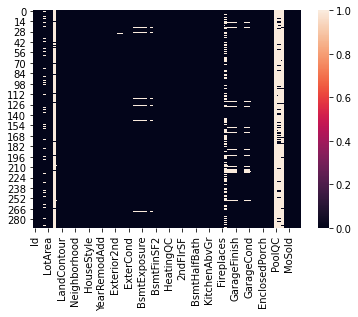

In [70]:
sns.heatmap(df2.isnull())

<AxesSubplot:xlabel='LotFrontage', ylabel='Density'>

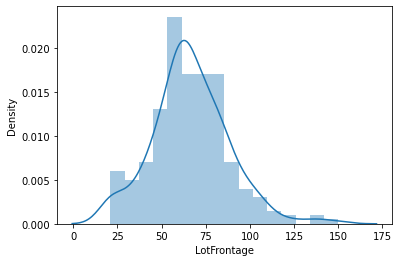

In [71]:
sns.distplot(df2['LotFrontage'])

<AxesSubplot:xlabel='MasVnrArea', ylabel='Density'>

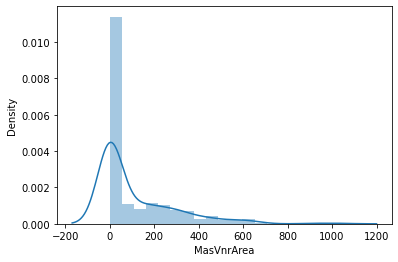

In [72]:
sns.distplot(df2['MasVnrArea'])

<AxesSubplot:xlabel='GarageYrBlt', ylabel='Density'>

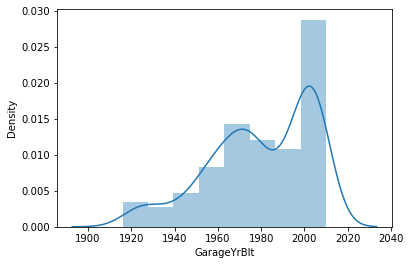

In [73]:
sns.distplot(df2['GarageYrBlt']) 

In [74]:
from sklearn.impute import SimpleImputer
si=SimpleImputer(missing_values=np.NaN,strategy='most_frequent')
df2['Alley']=si.fit_transform(df2['Alley'].values.reshape(-1,1))
df2['MasVnrType']=si.fit_transform(df2['MasVnrType'].values.reshape(-1,1))
df2['BsmtQual']=si.fit_transform(df2['BsmtQual'].values.reshape(-1,1))
df2['BsmtCond']=si.fit_transform(df2['BsmtCond'].values.reshape(-1,1))
df2['BsmtExposure']=si.fit_transform(df2['BsmtExposure'].values.reshape(-1,1))
df2['BsmtFinType1']=si.fit_transform(df2['BsmtFinType1'].values.reshape(-1,1))
df2['BsmtFinType2']=si.fit_transform(df2['BsmtFinType2'].values.reshape(-1,1))
df2['Electrical']=si.fit_transform(df2['Electrical'].values.reshape(-1,1))
df2['FireplaceQu']=si.fit_transform(df2['FireplaceQu'].values.reshape(-1,1))
df2['GarageType']=si.fit_transform(df2['GarageType'].values.reshape(-1,1))
df2['GarageFinish']=si.fit_transform(df2['GarageFinish'].values.reshape(-1,1))
df2['GarageQual']=si.fit_transform(df2['GarageQual'].values.reshape(-1,1))
df2['GarageCond']=si.fit_transform(df2['GarageCond'].values.reshape(-1,1))

In [75]:
si=SimpleImputer(missing_values=np.NaN,strategy='median')
df2['MasVnrArea']=si.fit_transform(df2['MasVnrArea'].values.reshape(-1,1))
df2['GarageYrBlt']=si.fit_transform(df2['GarageYrBlt'].values.reshape(-1,1))

In [76]:
si=SimpleImputer(missing_values=np.NaN,strategy='mean')
df2['LotFrontage']=si.fit_transform(df2['LotFrontage'].values.reshape(-1,1))

In [77]:
df2.drop(['PoolQC','Fence','MiscFeature'],axis=1,inplace=True)

In [78]:
df2

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.000000,14157,Pave,Grvl,IR1,HLS,AllPub,...,51,0,0,0,0,0,7,2007,WD,Normal
1,1018,120,RL,66.425101,5814,Pave,Grvl,IR1,Lvl,AllPub,...,0,0,0,0,0,0,8,2009,COD,Abnorml
2,929,20,RL,66.425101,11838,Pave,Grvl,Reg,Lvl,AllPub,...,151,0,0,0,0,0,6,2009,WD,Normal
3,1148,70,RL,75.000000,12000,Pave,Grvl,Reg,Bnk,AllPub,...,0,0,0,0,0,0,7,2009,WD,Normal
4,1227,60,RL,86.000000,14598,Pave,Grvl,IR1,Lvl,AllPub,...,18,0,0,0,0,0,1,2008,WD,Normal
5,650,180,RM,21.000000,1936,Pave,Grvl,Reg,Lvl,AllPub,...,0,0,0,0,0,0,12,2007,WD,Normal
6,1453,180,RM,35.000000,3675,Pave,Grvl,Reg,Lvl,AllPub,...,28,0,0,0,0,0,5,2006,WD,Normal
7,152,20,RL,107.000000,13891,Pave,Grvl,Reg,Lvl,AllPub,...,102,0,0,0,0,0,1,2008,New,Partial
8,427,80,RL,66.425101,12800,Pave,Grvl,Reg,Low,AllPub,...,0,0,0,396,0,0,8,2009,WD,Normal
9,776,120,RM,32.000000,4500,Pave,Grvl,Reg,Lvl,AllPub,...,247,0,0,0,0,0,6,2009,WD,Normal


In [79]:
df2.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

In [80]:
df2.shape

(292, 77)

In [81]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df2['MSZoning']=le.fit_transform(df2['MSZoning'])
df2['Street']=le.fit_transform(df2['Street'])
df2['Alley']=le.fit_transform(df2['Alley'])
df2['LotShape']=le.fit_transform(df2['LotShape'])
df2['LandContour']=le.fit_transform(df2['MSZoning'])
df2['Utilities']=le.fit_transform(df2['Utilities'])
df2['LotConfig']=le.fit_transform(df2['LotConfig'])
df2['LandSlope']=le.fit_transform(df2['LandSlope'])
df2['Neighborhood']=le.fit_transform(df2['Neighborhood'])
df2['Condition1']=le.fit_transform(df2['Condition1'])
df2['Condition2']=le.fit_transform(df2['Condition2'])
df2['BldgType']=le.fit_transform(df2['BldgType'])
df2['HouseStyle']=le.fit_transform(df2['HouseStyle'])
df2['RoofStyle']=le.fit_transform(df2['RoofStyle'])
df2['RoofMatl']=le.fit_transform(df2['RoofMatl'])
df2['Exterior1st']=le.fit_transform(df2['Exterior1st'])
df2['Exterior2nd']=le.fit_transform(df2['Exterior2nd'])
df2['MasVnrType']=le.fit_transform(df2['MasVnrType'])
df2['ExterQual']=le.fit_transform(df2['ExterQual'])
df2['ExterCond']=le.fit_transform(df2['ExterCond'])
df2['BsmtQual']=le.fit_transform(df2['BsmtQual'])
df2['Foundation']=le.fit_transform(df2['Foundation'])
df2['BsmtCond']=le.fit_transform(df2['BsmtCond'])
df2['BsmtExposure']=le.fit_transform(df2['BsmtExposure'])
df2['BsmtFinType1']=le.fit_transform(df2['BsmtFinType1'])
df2['BsmtFinType2']=le.fit_transform(df2['BsmtFinType2'])
df2['Heating']=le.fit_transform(df2['Heating'])
df2['HeatingQC']=le.fit_transform(df2['HeatingQC'])
df2['CentralAir']=le.fit_transform(df2['CentralAir'])
df2['Electrical']=le.fit_transform(df2['Electrical'])
df2['KitchenQual']=le.fit_transform(df2['KitchenQual'])
df2['Functional']=le.fit_transform(df2['Functional'])
df2['FireplaceQu']=le.fit_transform(df2['FireplaceQu'])
df2['GarageType']=le.fit_transform(df2['GarageType'])
df2['GarageFinish']=le.fit_transform(df2['GarageFinish'])
df2['GarageQual']=le.fit_transform(df2['GarageQual'])
df2['GarageCond']=le.fit_transform(df2['GarageCond'])
df2['PavedDrive']=le.fit_transform(df2['PavedDrive'])
df2['SaleType']=le.fit_transform(df2['SaleType'])
df2['SaleCondition']=le.fit_transform(df2['SaleCondition'])

In [82]:
df2

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,2,86.000000,14157,1,0,0,2,0,...,51,0,0,0,0,0,7,2007,5,2
1,1018,120,2,66.425101,5814,1,0,0,2,0,...,0,0,0,0,0,0,8,2009,0,0
2,929,20,2,66.425101,11838,1,0,3,2,0,...,151,0,0,0,0,0,6,2009,5,2
3,1148,70,2,75.000000,12000,1,0,3,2,0,...,0,0,0,0,0,0,7,2009,5,2
4,1227,60,2,86.000000,14598,1,0,0,2,0,...,18,0,0,0,0,0,1,2008,5,2
5,650,180,3,21.000000,1936,1,0,3,3,0,...,0,0,0,0,0,0,12,2007,5,2
6,1453,180,3,35.000000,3675,1,0,3,3,0,...,28,0,0,0,0,0,5,2006,5,2
7,152,20,2,107.000000,13891,1,0,3,2,0,...,102,0,0,0,0,0,1,2008,4,3
8,427,80,2,66.425101,12800,1,0,3,2,0,...,0,0,0,396,0,0,8,2009,5,2
9,776,120,3,32.000000,4500,1,0,3,3,0,...,247,0,0,0,0,0,6,2009,5,2


In [85]:
DecisionTree=DecisionTreeRegressor()
DecisionTree.fit(x_train,y_train)

DecisionTreeRegressor()

In [86]:
pred=DecisionTree.predict(x_test)
pred

array([ 81000., 239000., 289000., 175900., 155000., 178000., 162000.,
       167240., 274970., 266500., 123000., 160000., 377500.,  80000.,
       135000., 274000., 157900., 150000., 137000., 143750., 320000.,
       203000., 118964., 187100., 149900., 189000.,  76000., 150000.,
       132000., 195000., 117000., 184000., 145000.,  80000., 138887.,
       315000., 157900., 386250., 157900., 214500., 180000., 178740.,
       102000., 204750., 187500., 297000., 139950., 102000., 184000.,
        66500., 227875., 129900., 133000., 236000., 270000., 215000.,
       213000., 148000., 225000., 205000., 185000., 140000., 156000.,
       127500., 130000., 257500., 149900., 222000., 250580., 119900.,
       103000., 135000., 175900., 185000., 152000., 255900., 143750.,
       140000., 185000., 193500., 228950., 163000., 140000., 276000.,
       262280., 136000., 235000., 320000., 132000.,  87500., 158000.,
       148000., 190000., 145000., 314813., 137000., 119000., 350000.,
       146000., 1370

In [87]:
LinearReg=LinearRegression()
LinearReg.fit(x_train,y_train)

LinearRegression()

In [88]:
pred=LinearReg.predict(x_test)
pred

array([ 69772.04847652, 290138.14662187, 181475.31311742, 194512.17876604,
       158008.00670268, 198873.69935943, 198094.84253326, 249379.39456436,
       228512.64423723, 229519.30753958, 103113.03688305, 142383.5524246 ,
       345623.52766124,  49471.36583948, 118892.6248858 , 268041.43676534,
       133889.90955736, 205584.43661016, 126522.60533487, 142306.35345289,
       349022.26391682, 204291.2665191 , 123564.0626953 , 192706.52765359,
       113394.45603516, 181601.39366115,  67446.41852177, 122201.11422512,
       199630.01720442, 224568.56445642, 145422.08518283, 172076.43229791,
       133523.91826176,  68075.84623824,  99485.6684747 , 296583.80141327,
       145282.02429449, 308438.89340236, 158343.67911708, 200888.82854509,
       213074.66471981, 238888.57341116, 111344.37830155, 194250.01738602,
       169068.18090735, 275015.52621106, 131173.76375052, 127074.7309282 ,
       181589.13742714,  99141.52691317, 245729.30772564, 105508.51531041,
       109824.26132359, 2

In [90]:
KNeighbors=KNeighborsRegressor()
KNeighbors.fit(x_train,y_train)

KNeighborsRegressor()

In [91]:
pred=KNeighbors.predict(x_test)
pred

array([132198. , 255480. , 221200. , 154700. , 148500. , 136800. ,
       199500. , 150100. , 205980. , 216380. , 108601.6, 142700. ,
       200980. , 115200. , 134800. , 228900. , 145580. , 156700. ,
       189660. , 140400. , 313890. , 220400. , 112292.8, 171020. ,
       143250. , 226787. , 126100. , 110636. , 169040. , 193900. ,
       171108. , 157700. , 132630. , 114230. , 173608. , 176990. ,
       146120. , 201480. , 162640. , 199377. , 177100. , 268332.6,
       153400. , 201400. , 131950. , 236500. , 142380. , 144700. ,
       184870. , 154860. , 219500. , 138800. , 126860. , 221700. ,
       118000. , 187327.8, 181080. , 155732. , 253400. , 164435. ,
       162900. , 130600. , 150080. , 297530.8, 134460. , 316250. ,
       137500. , 212150. , 185600. , 138280. , 120390. , 112200. ,
       171800. , 319250. , 164300. , 262000. , 141150. , 158880. ,
       160200. , 253800. , 263384.4, 164540. , 134160. , 254200. ,
       256100. , 154300. , 178500. , 269000. , 193160. , 12057

In [92]:
RandomForest=RandomForestRegressor()
RandomForest.fit(x_train,y_train)

RandomForestRegressor()

In [93]:
pred=RandomForest.predict(x_test)
pred

array([103931.3 , 304508.7 , 205590.97, 180233.  , 147102.7 , 161921.5 ,
       177509.8 , 183052.07, 189874.4 , 221327.97, 114381.42, 155662.94,
       343215.24,  84121.63, 113843.  , 289746.32, 140931.  , 166381.  ,
       135277.6 , 141201.7 , 356049.98, 199887.75, 130399.4 , 206558.63,
       135145.28, 212018.77,  91758.96, 126185.61, 173223.95, 219708.2 ,
       127071.01, 160778.94, 146345.2 ,  83862.75, 126370.72, 312214.82,
       157080.9 , 301487.26, 149233.01, 207938.19, 205402.4 , 227173.31,
       116969.08, 209111.37, 162745.28, 291534.01, 135796.08, 113800.74,
       184955.87, 100162.93, 219772.8 , 119092.58, 126566.  , 223416.55,
       218371.28, 213179.57, 212833.9 , 142967.9 , 238984.24, 207880.05,
       170227.75, 141218.5 , 137843.83, 200255.04, 130978.26, 202758.24,
       129765.7 , 248292.6 , 228305.08, 118622.24, 121003.18, 155825.25,
       180291.15, 153522.71, 173504.85, 316414.18, 140075.  , 154146.04,
       159543.87, 187820.85, 199601.08, 160967.82, 

In [94]:
SVR=SVR()
SVR.fit(x_train,y_train)

SVR()

In [95]:
pred=SVR.predict(x_test)
pred

array([162887.52655683, 162909.3129261 , 162871.40026244, 162913.84707701,
       162921.02897042, 162903.93873105, 162951.0876945 , 162894.81910088,
       162897.84932203, 162907.32025336, 162884.29524054, 162863.73123705,
       162918.15879564, 162896.31691055, 162877.68652856, 162873.84305983,
       162898.27779309, 162895.87298055, 162947.96909826, 162889.67130806,
       162931.87210043, 162888.56573668, 162878.15783293, 162941.46974051,
       162902.5097819 , 162883.37817655, 162879.55712877, 162872.6283509 ,
       162896.56958009, 162896.95257527, 162891.93498074, 162882.86985924,
       162914.62031702, 162905.45913349, 162892.0961482 , 162882.80138721,
       162889.45028167, 162893.49525195, 162893.88309611, 162888.36184735,
       162867.87264248, 162932.39857436, 162923.45611413, 162901.03136495,
       162917.71433916, 162911.13189153, 162894.6796526 , 162882.52024607,
       162896.07198454, 162900.62732591, 162908.98365605, 162889.96331214,
       162878.25461341, 1